## 1. Import the metrics module

you can run this notebook in the container <docker://mwatelescope/mwa-demo:latest>

or you can just download this notebook, along with demo/81_metrics.py and run it locally.

(the preview in github cuts off half way through)

In [21]:
import sys
import importlib.util
from pathlib import Path
import requests


# Import the metrics module (since module names can't start with numbers)
cwd = Path.cwd()
spec = importlib.util.spec_from_file_location('metrics_81', cwd / '81_metrics.py')
metrics = importlib.util.module_from_spec(spec)
spec.loader.exec_module(metrics)

print("Metrics module imported successfully!")
print("Available functions:", [f for f in dir(metrics) if f.startswith('plot_') or f.startswith('load_')])

from matplotlib import pyplot as plt
plt.style.use('dark_background')


Metrics module imported successfully!
Available functions: ['load_metafits_receiver_mapping', 'load_metrics_data', 'plot_all_metrics', 'plot_amp_fp_grid', 'plot_auto_delay_pol', 'plot_auto_pol', 'plot_auto_pol_lines', 'plot_auto_power_ant', 'plot_auto_power_ant_lines', 'plot_auto_sub_ant', 'plot_timeseries', 'plot_waterfall']


## 2. Load your data once


In [22]:

metrics_files = []

for url in [
    # 2025-07-11T15:55:58Z | 20_2.0 | RADec300.0,-27.0 | ch143 |
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436284456_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436284576_metrics.fits",
    # 2025-07-11T19:55:18Z | 20_2.0 | EOR0             | ch143 |
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436298936_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436299232_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436299528_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436299824_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436300120_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436300416_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436300712_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436301008_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436301304_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436301600_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436301896_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436302192_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436302488_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436302784_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436303080_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436303376_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436303672_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436303968_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436304264_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436304560_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436304856_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436305152_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436305448_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436305744_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436388656_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436729760_metrics.fits",
    # 2025-07-16T19:35:42Z | 40_0.5 | EOR0             | ch143 |
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436730056_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436730352_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436730648_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436730944_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436731240_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436731536_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436731832_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436732128_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436732424_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436732720_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436733016_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436733312_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436733608_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436733904_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436734200_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436734496_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436734792_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436735088_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436735384_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436735680_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436735976_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436736272_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436736568_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1436736864_metrics.fits",
    # 2025-07-21T19:19:58Z | 40_0.5 | EOR0             | ch70 |
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437160456_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437160576_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437160696_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437160816_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437161704_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437162296_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437162592_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437162888_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437163184_metrics.fits",
    # 2025-07-21T19:59:58Z | 40_0.5 | EOR0             | ch121 |
    "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437163216_metrics.fits",
    "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437163512_metrics.fits",
    "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437163808_metrics.fits",
    "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437164104_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437164400_metrics.fits",
    "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437164696_metrics.fits",
    "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437164992_metrics.fits",
    "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437165288_metrics.fits",
    "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437165584_metrics.fits",
    # 2025-07-21T20:39:58Z | 40_0.5 | EOR0             | ch143 |
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437165616_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437165912_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437166208_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437166504_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437166800_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437167096_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437167392_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437167688_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437168016_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437168136_metrics.fits",
    # "https://projects.pawsey.org.au/metrics-raw/birli_nodig_nopfb_1437168256_metrics.fits",
]:
    # check if the file exists on disk before downloading
    path = Path(url.split('/')[-1])
    metrics_files.append(path)
    if not path.exists():
        print(f"Downloading {url}")
        response = requests.get(url)
        with open(url.split('/')[-1], 'wb') as f:
            f.write(response.content)


metafits_path = Path('1437167984.metafits')
obsid = metafits_path.stem
if not metafits_path.exists():
    print(f"Downloading {metafits_path}")
    response = requests.get(f'http://ws.mwatelescope.org/metadata/fits?obs_id={obsid}')
    with open(metafits_path, 'wb') as f:
        f.write(response.content)

observation_name = obsid

print(f"Found {len(metrics_files)} metrics files")

# Load all data once - this takes the longest tim
print("Loading data (this may take a moment)...")
data = metrics.load_metrics_data(metrics_files, metafits_path)
print(f"Successfully processed {data['files_processed']} files")
print(f"Found {len(data['antenna_table'])} antennas")


Found 8 metrics files
Loading data (this may take a moment)...
Loaded receiver mapping for 128 antennas from metafits
Found 8 metrics files


/Users/dev/Code/mwa-demo/demo/81_metrics.py:235: RuntimeWarning: Mean of empty slice
  if hdu_name.startswith("AUTO_POL="):
/Users/dev/Code/mwa-demo/demo/81_metrics.py:236: RuntimeWarning: Mean of empty slice
  additional_data_2d[hdu_name].append(additional_hdu_data)
/Users/dev/Code/mwa-demo/demo/81_metrics.py:237: RuntimeWarning: Mean of empty slice
  additional_times_2d[hdu_name].append(gps_times[0])
/Users/dev/Code/mwa-demo/demo/81_metrics.py:238: RuntimeWarning: Mean of empty slice
  mean_data = np.nanmean(additional_hdu_data)
/Users/dev/Code/mwa-demo/demo/81_metrics.py:239: RuntimeWarning: Mean of empty slice
  mean_array = np.full(n_time_samples, mean_data)
/Users/dev/Code/mwa-demo/demo/81_metrics.py:240: RuntimeWarning: Mean of empty slice
  additional_data[hdu_name].append(mean_array)
/Users/dev/Code/mwa-demo/demo/81_metrics.py:241: RuntimeWarning: Mean of empty slice
  


Successfully processed 8 files
Found antenna information for 128 antennas
Successfully processed 8 files
Found 128 antennas


/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX19_XX_1437167984.png


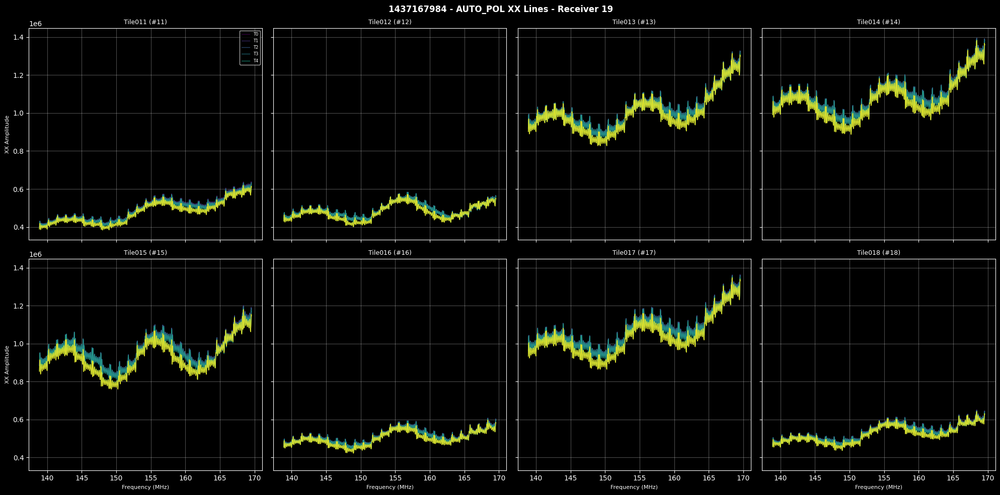

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX19_YY_1437167984.png


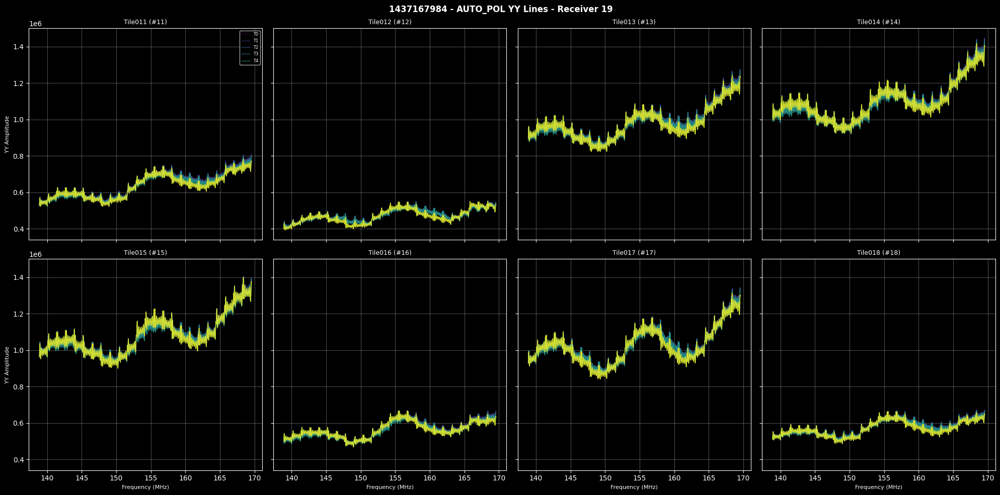

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX19_XY_1437167984.png


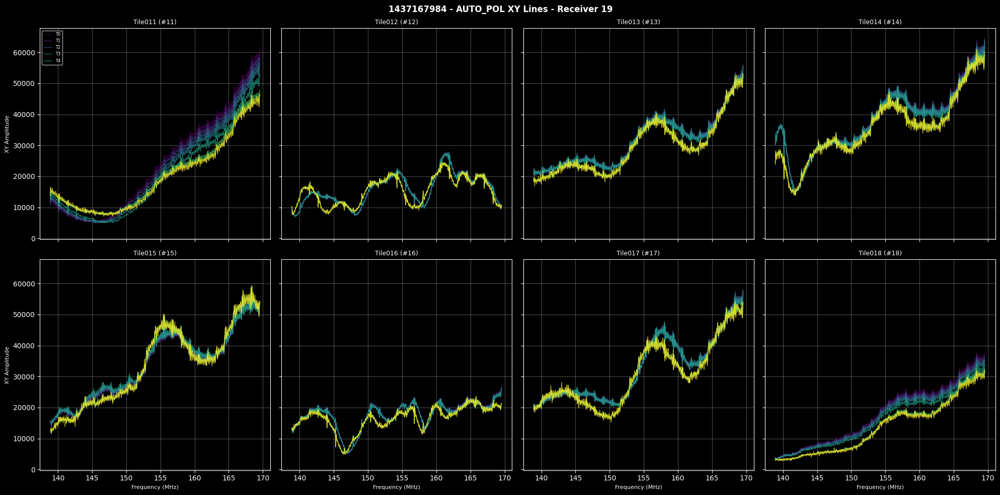

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX20_XX_1437167984.png


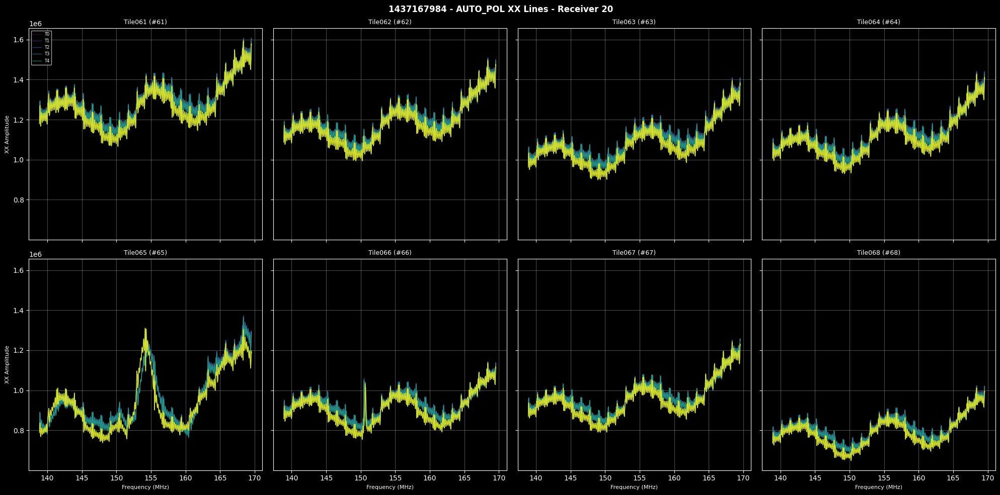

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX20_YY_1437167984.png


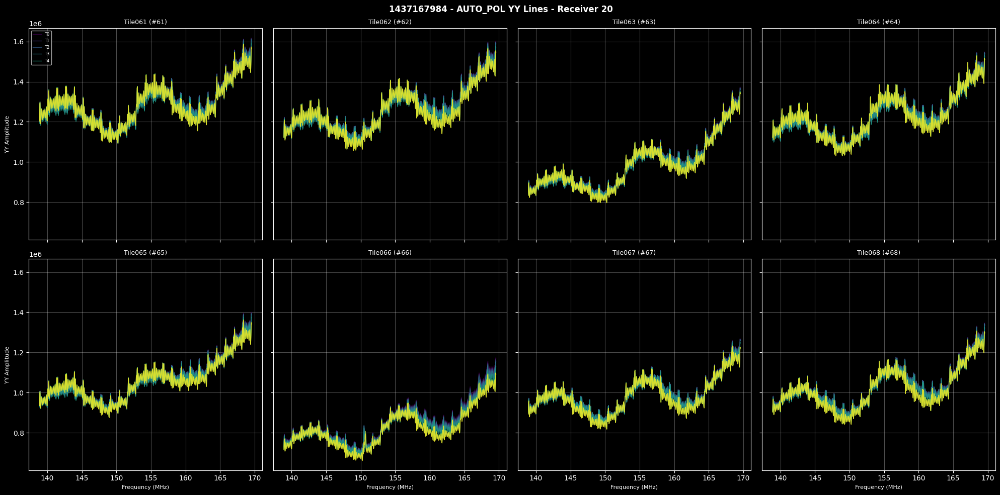

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX20_XY_1437167984.png


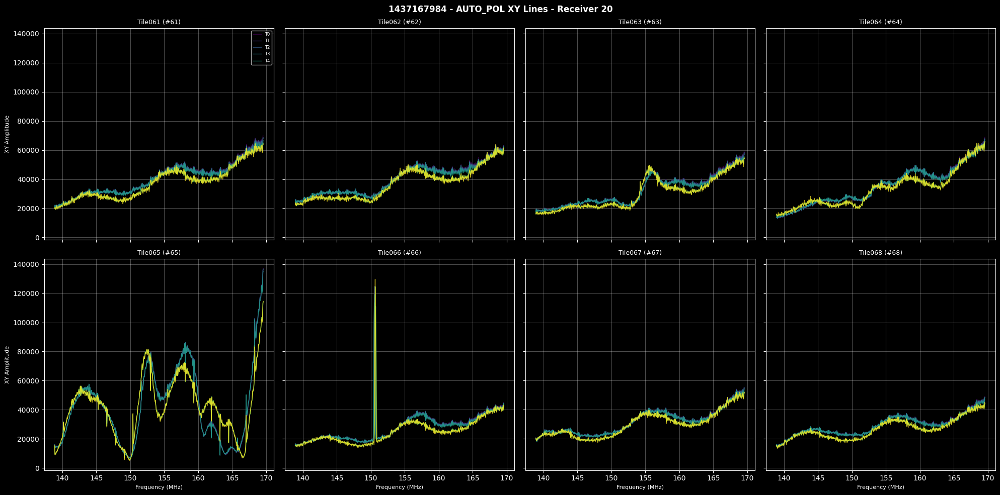

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX21_XX_1437167984.png


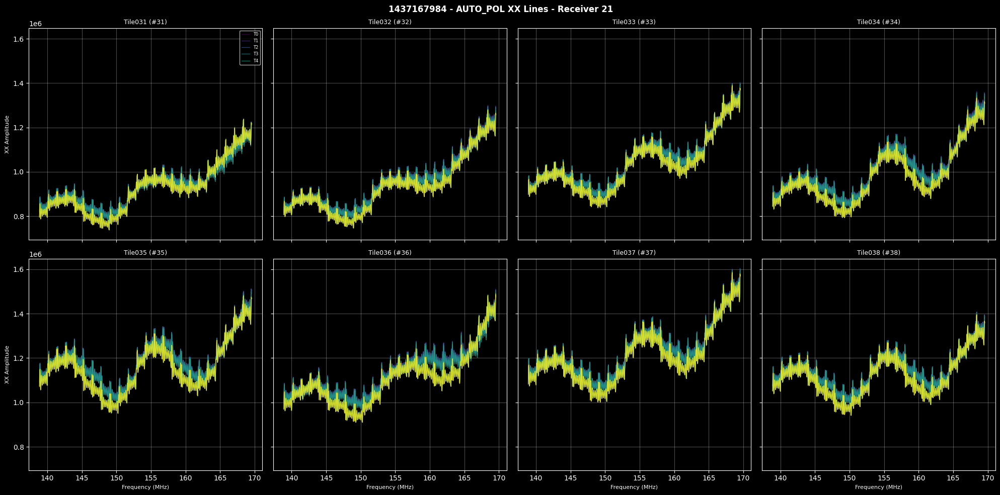

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX21_YY_1437167984.png


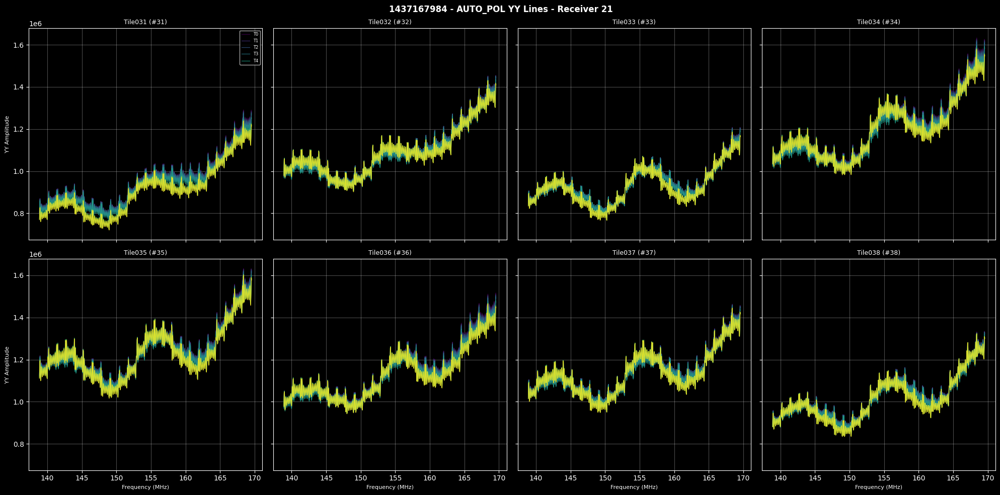

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX21_XY_1437167984.png


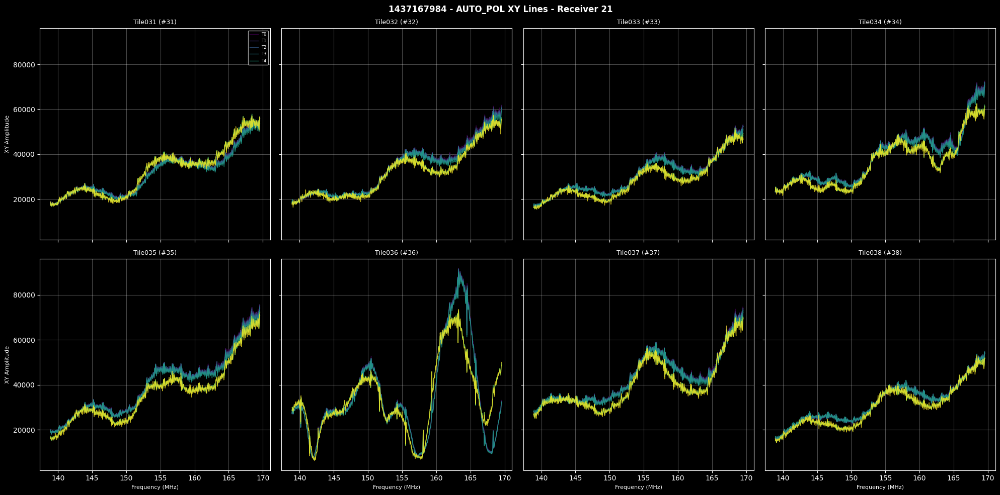

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX22_XX_1437167984.png


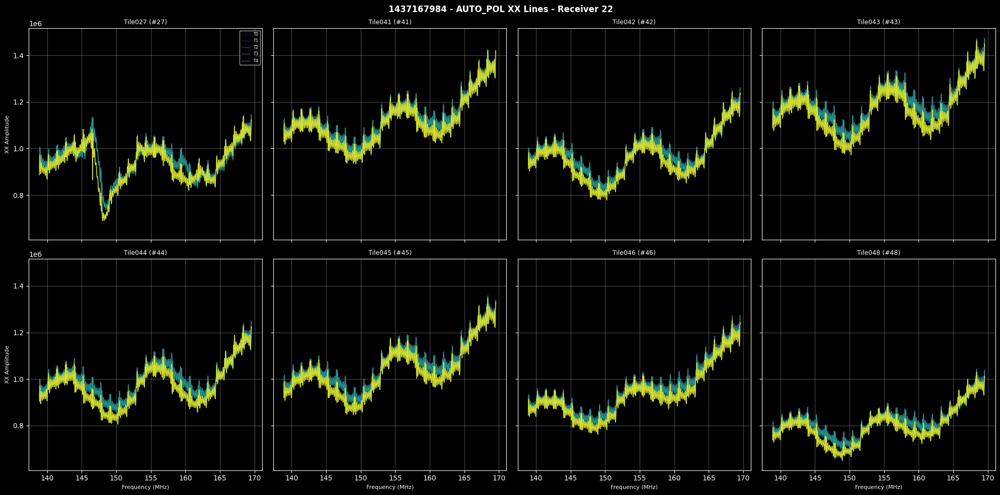

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX22_YY_1437167984.png


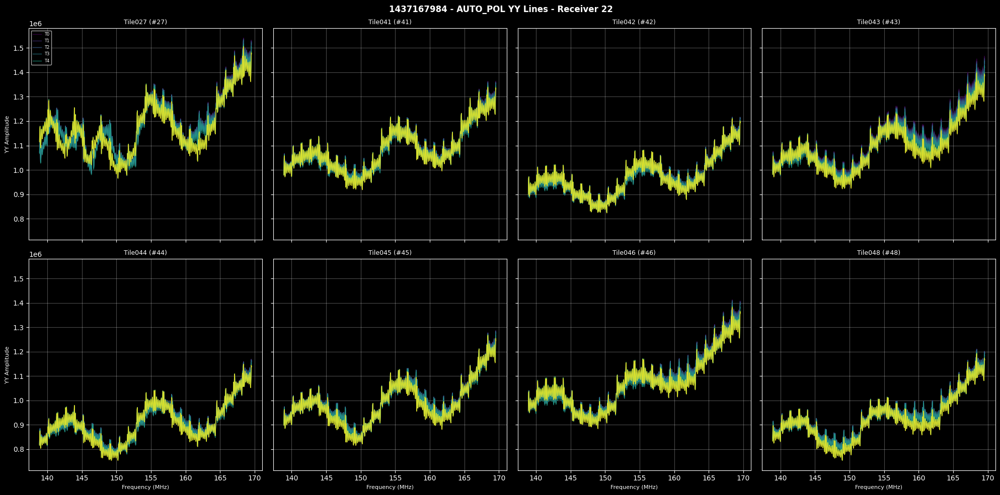

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX22_XY_1437167984.png


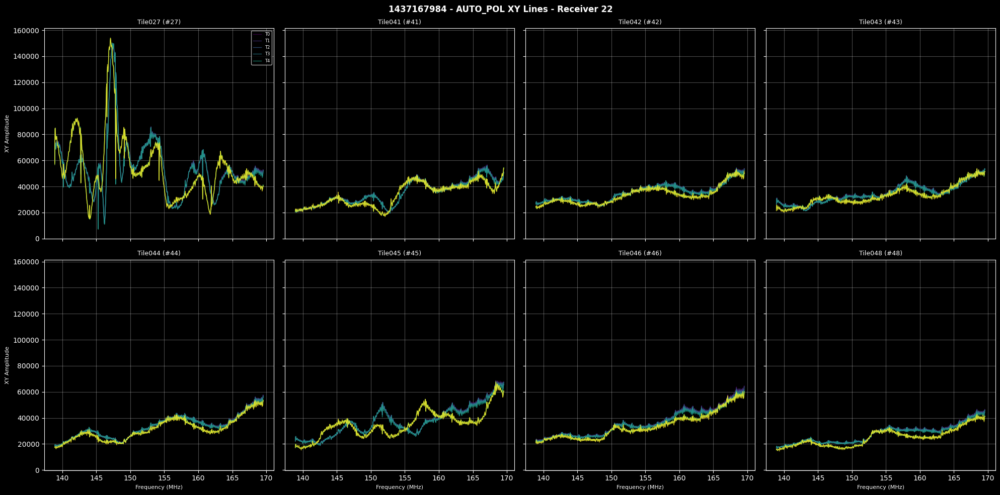

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX23_XX_1437167984.png


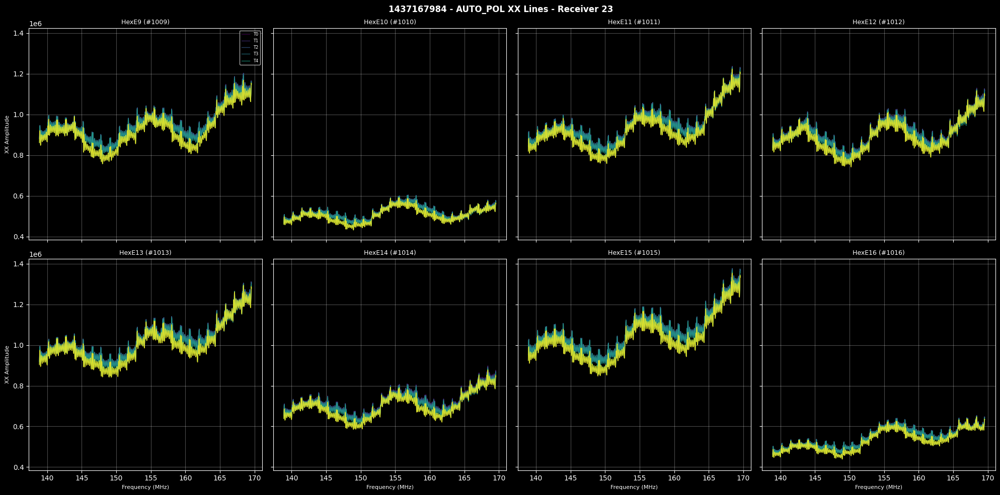

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX23_YY_1437167984.png


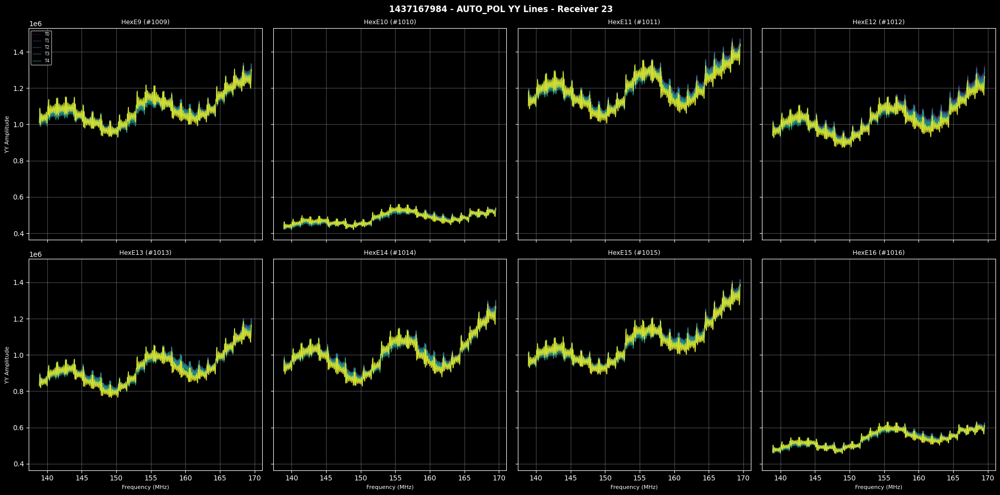

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX23_XY_1437167984.png


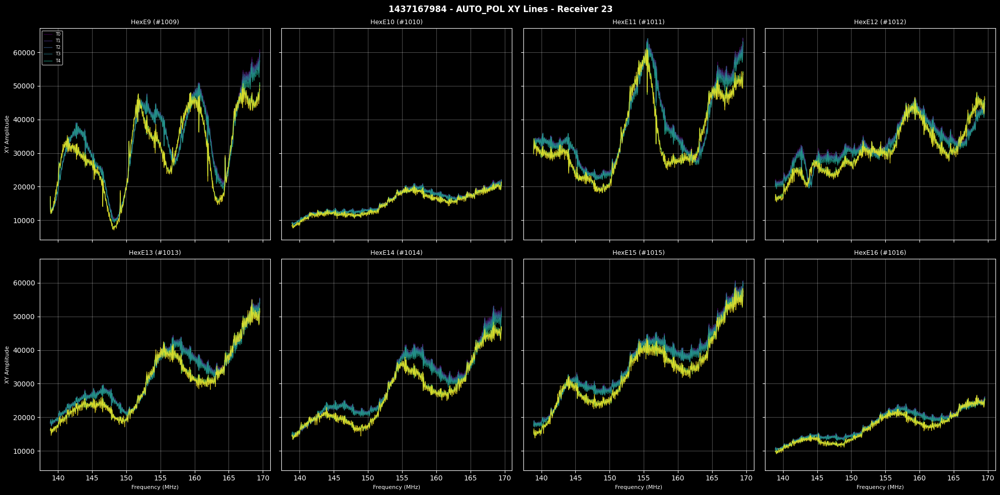

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX24_XX_1437167984.png


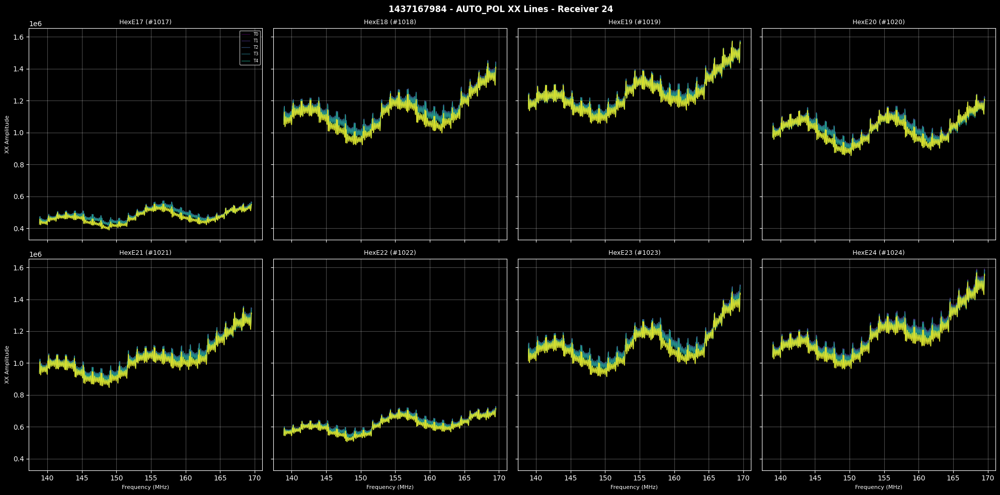

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX24_YY_1437167984.png


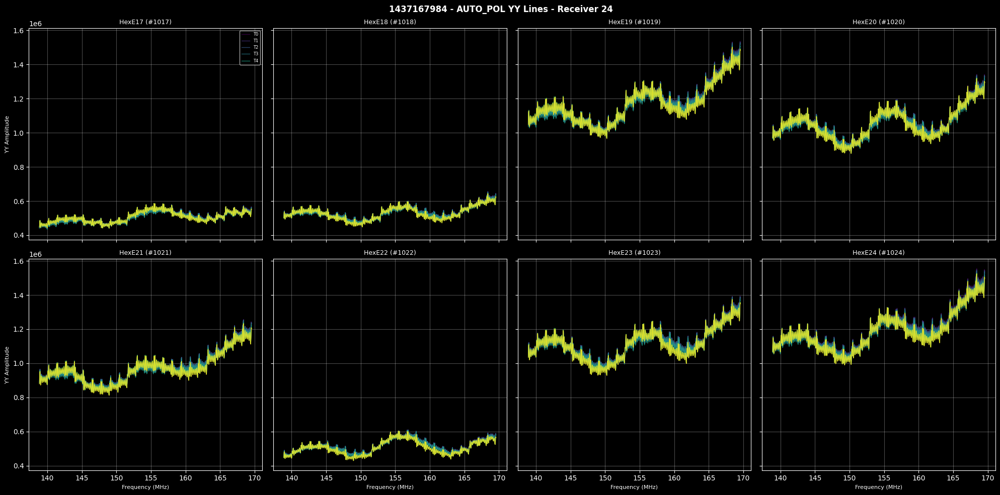

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX24_XY_1437167984.png


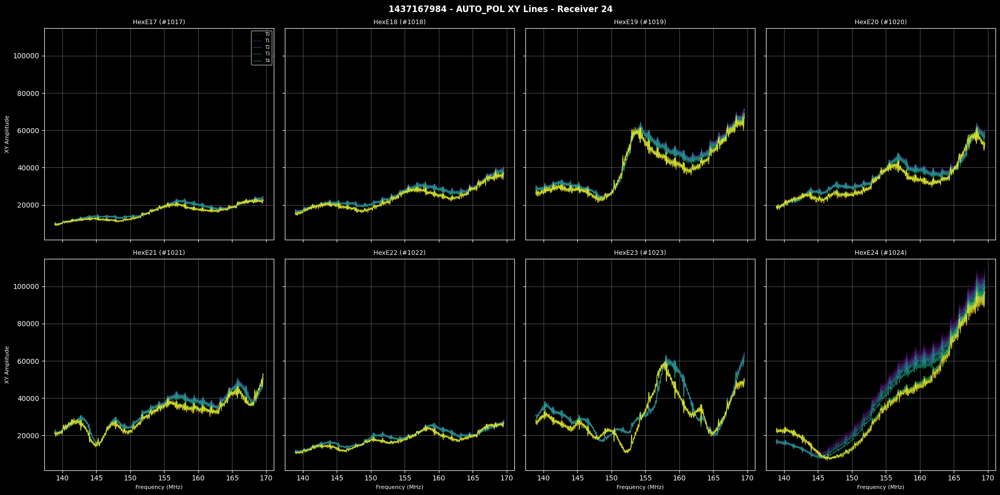

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX25_XX_1437167984.png


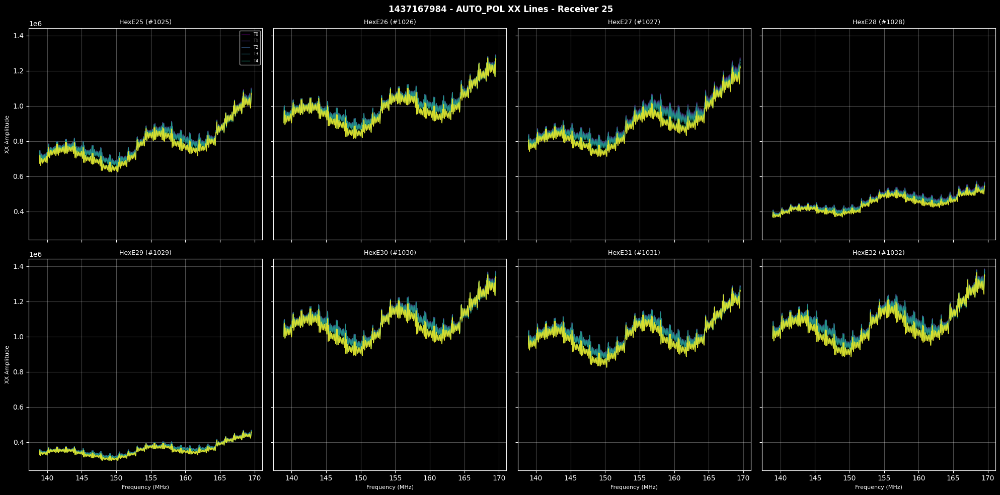

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX25_YY_1437167984.png


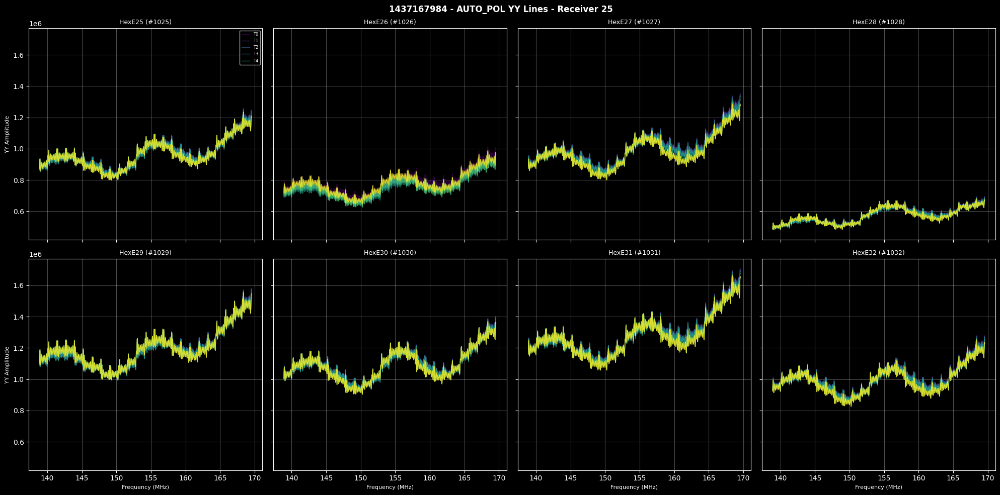

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX25_XY_1437167984.png


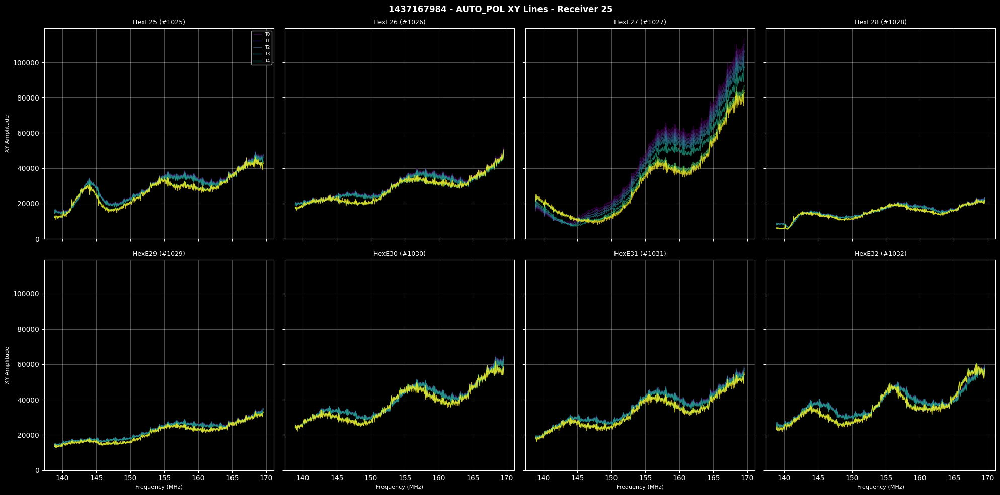

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX26_XX_1437167984.png


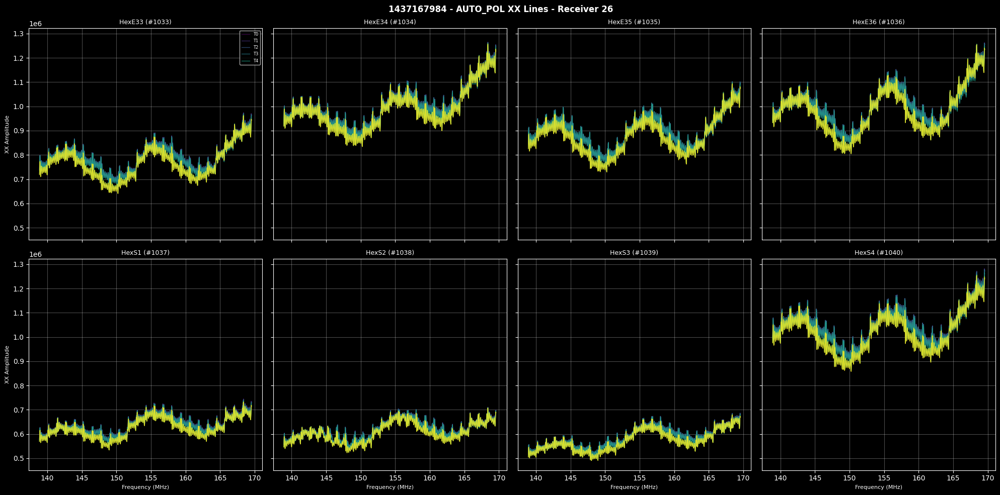

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX26_YY_1437167984.png


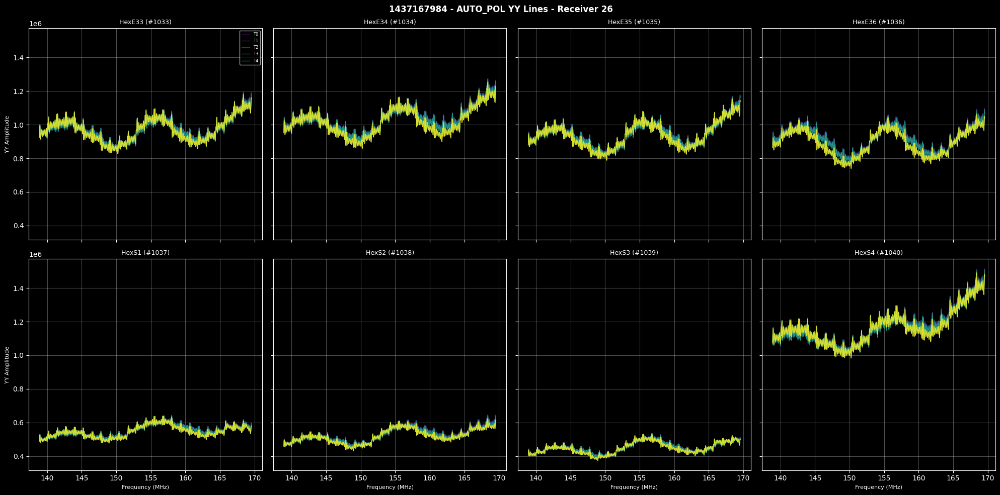

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX26_XY_1437167984.png


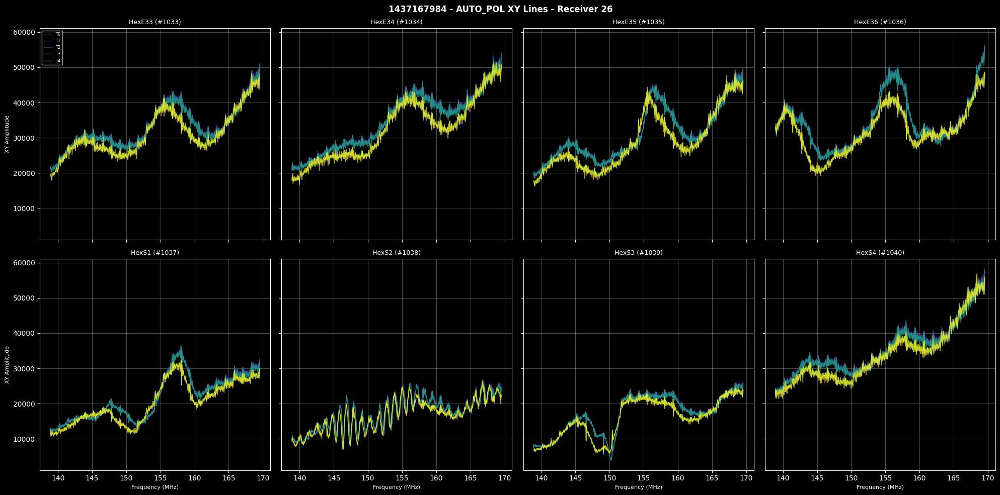

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX27_XX_1437167984.png


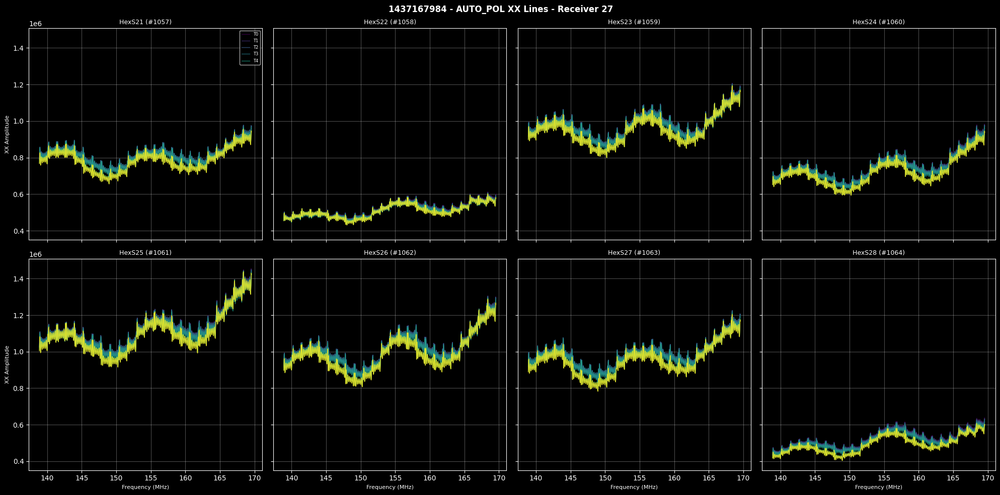

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX27_YY_1437167984.png


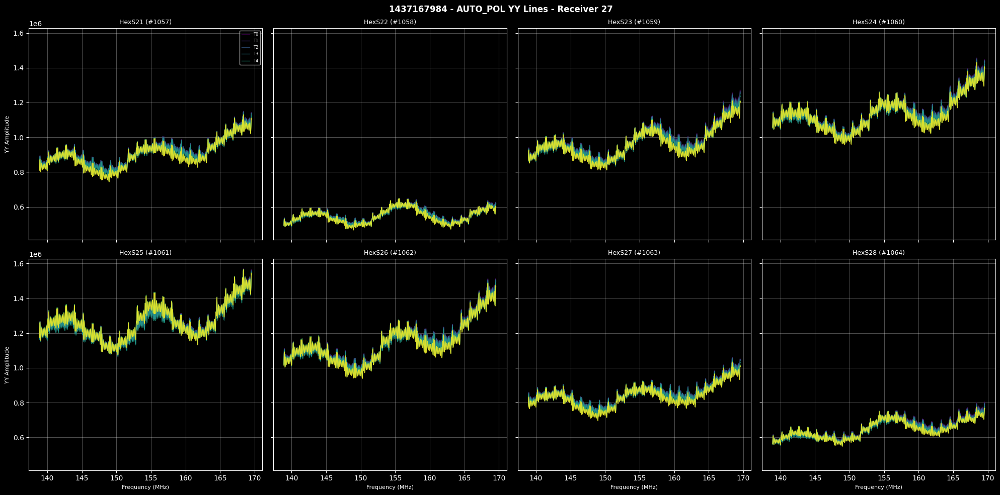

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX27_XY_1437167984.png


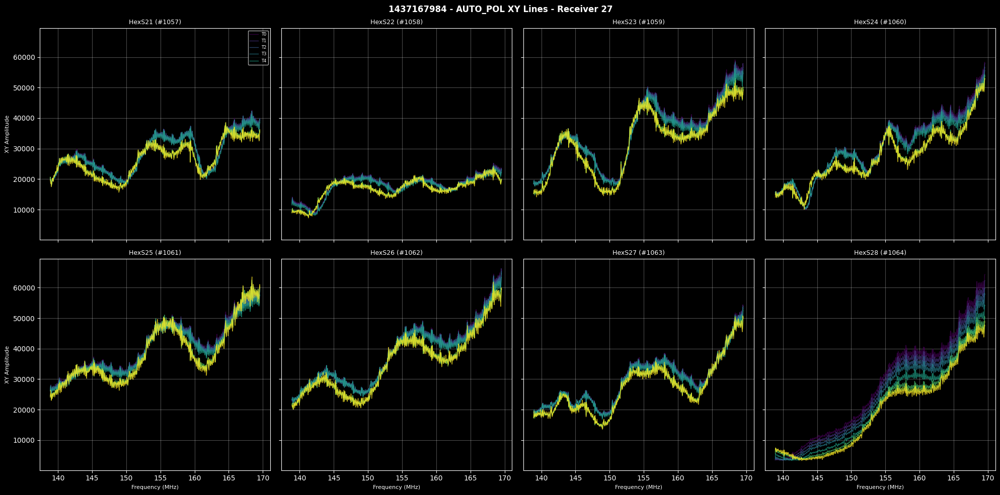

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX28_XX_1437167984.png


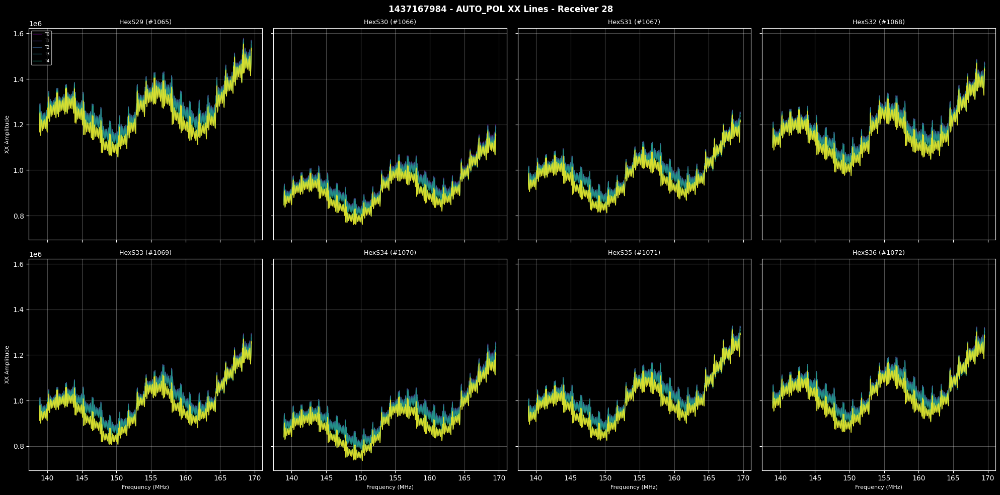

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX28_YY_1437167984.png


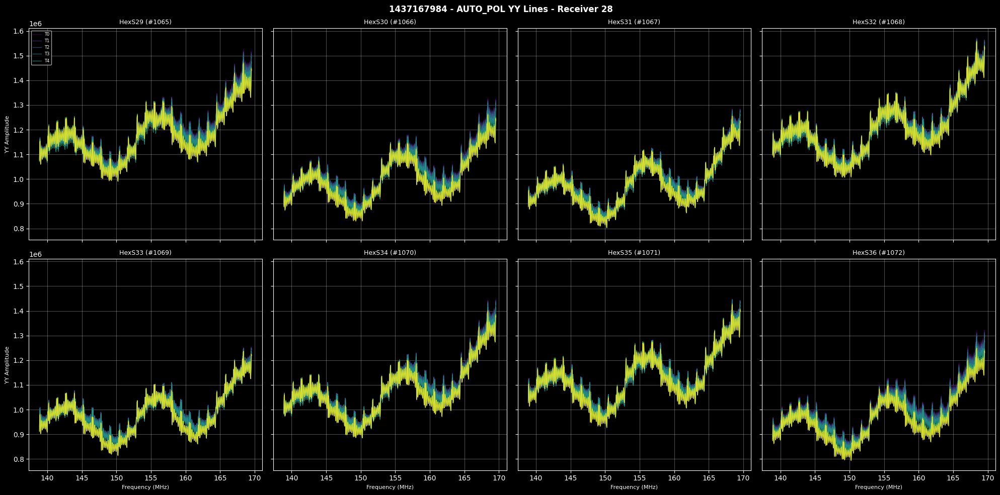

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX28_XY_1437167984.png


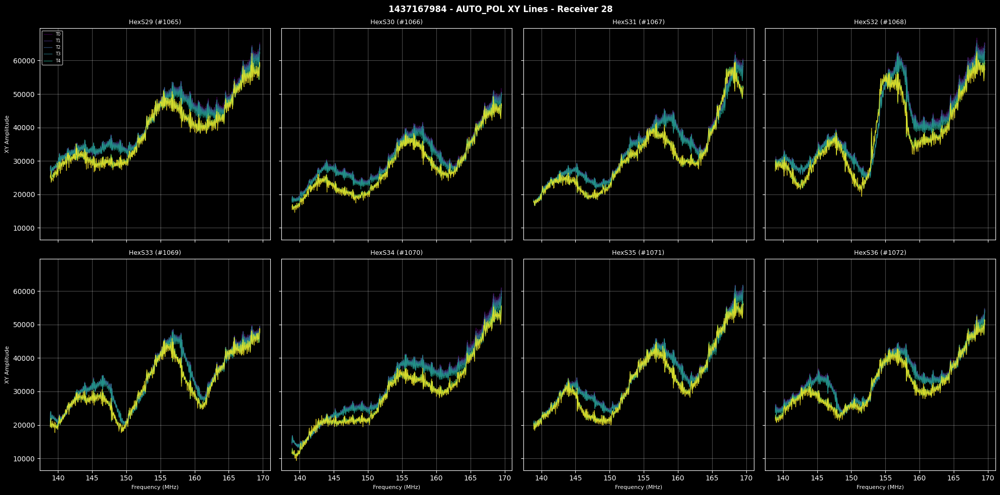

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX29_XX_1437167984.png


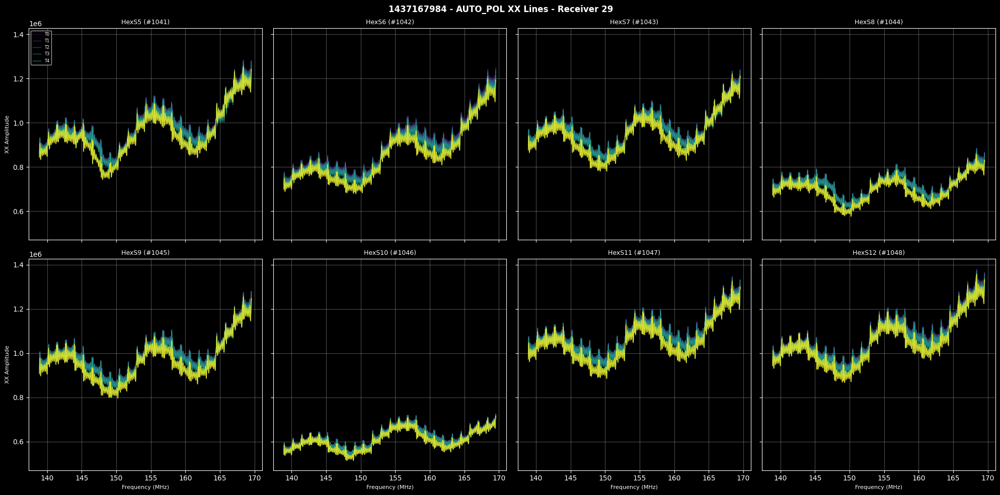

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX29_YY_1437167984.png


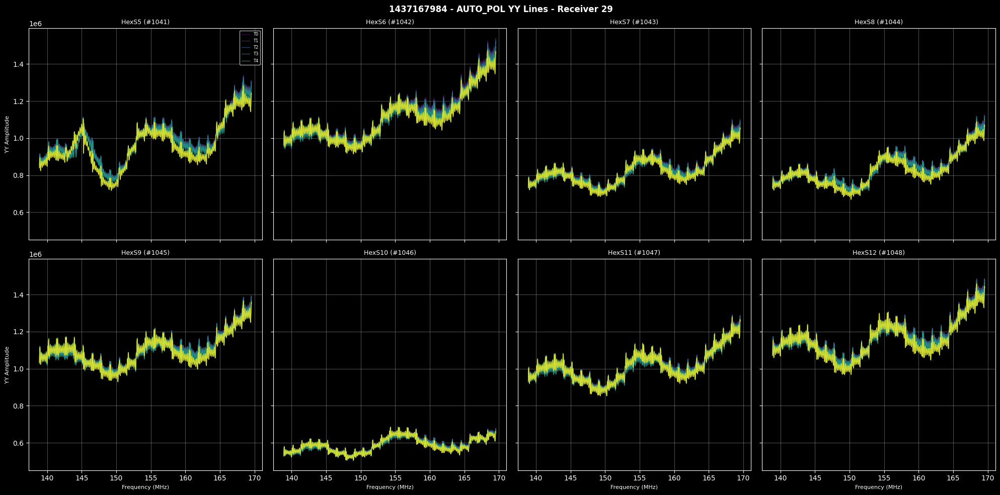

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX29_XY_1437167984.png


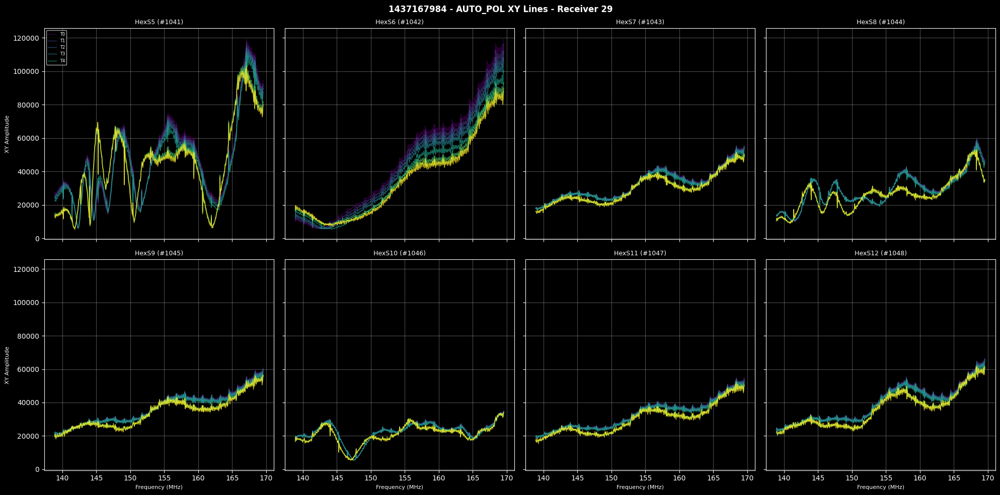

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX30_XX_1437167984.png


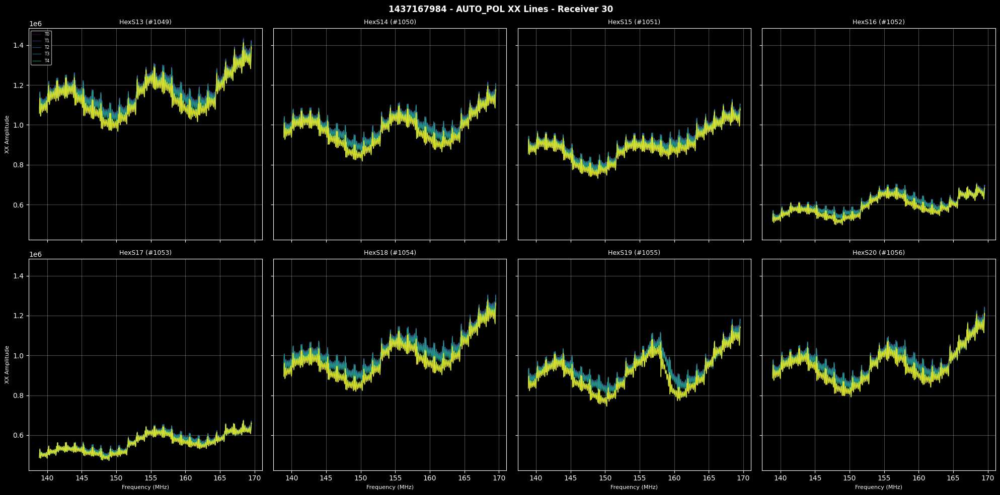

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX30_YY_1437167984.png


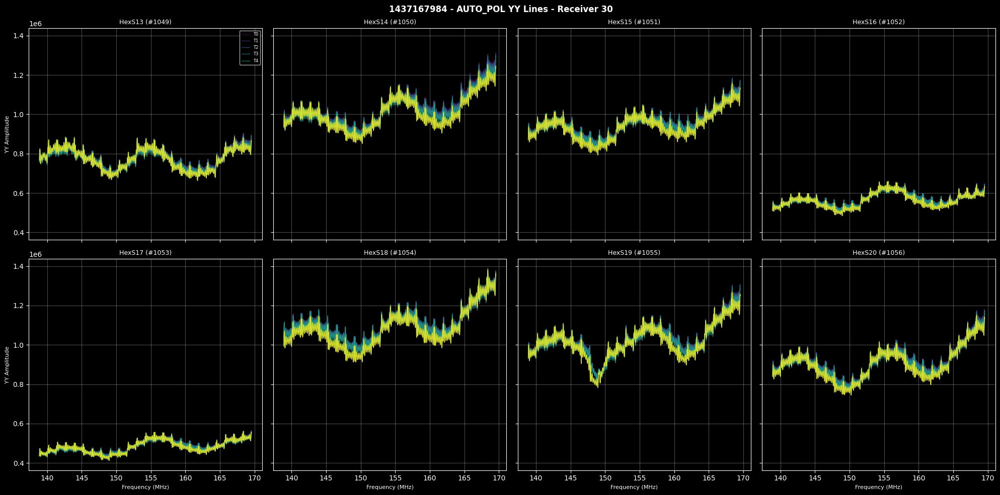

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX30_XY_1437167984.png


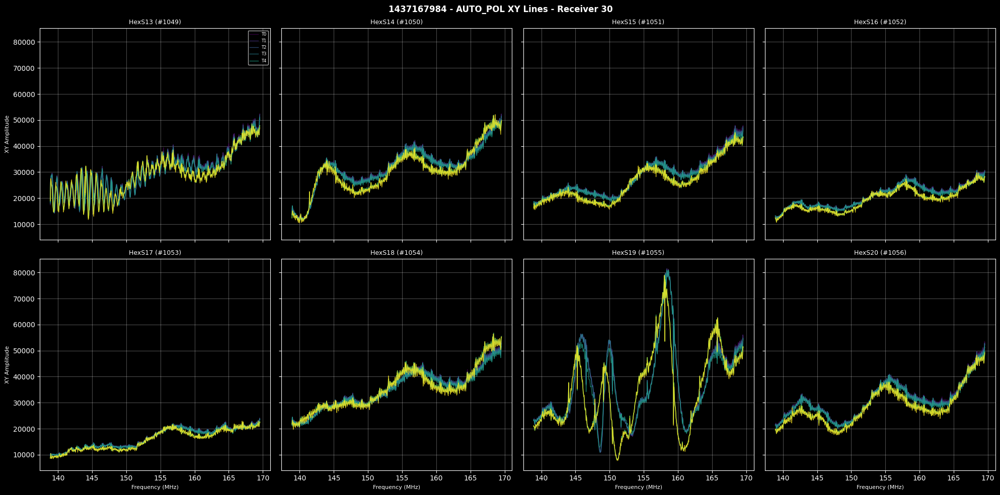

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX31_XX_1437167984.png


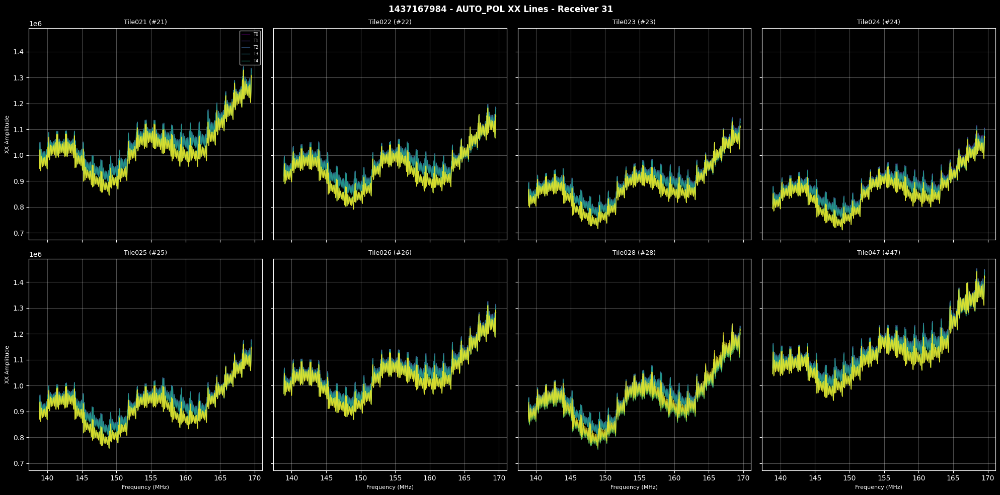

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX31_YY_1437167984.png


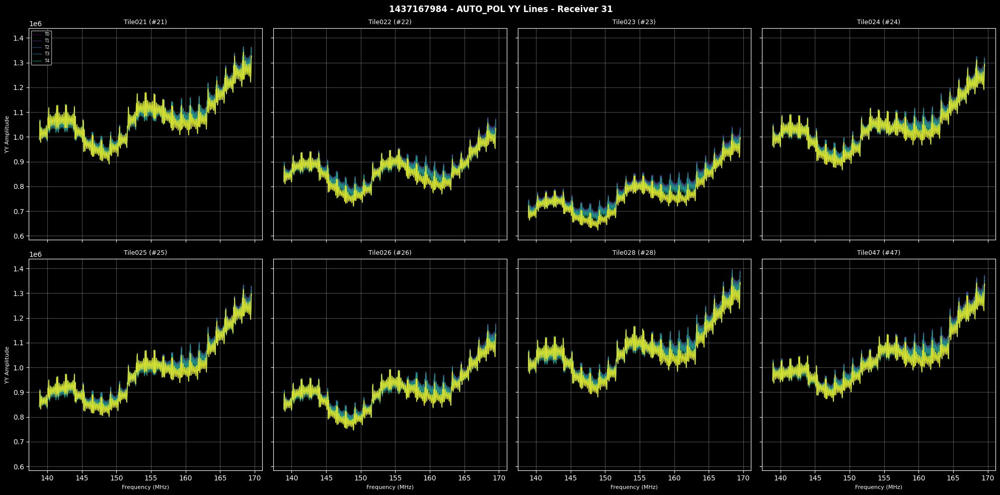

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX31_XY_1437167984.png


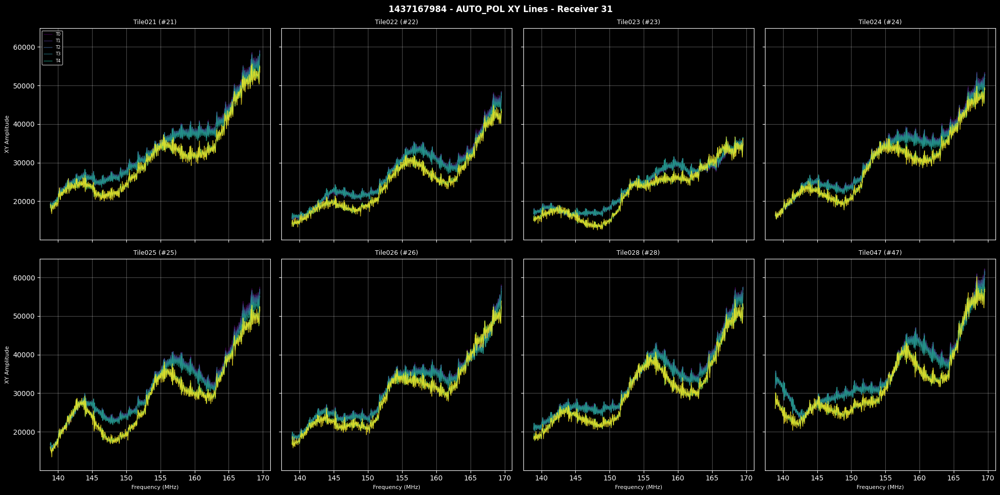

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX32_XX_1437167984.png


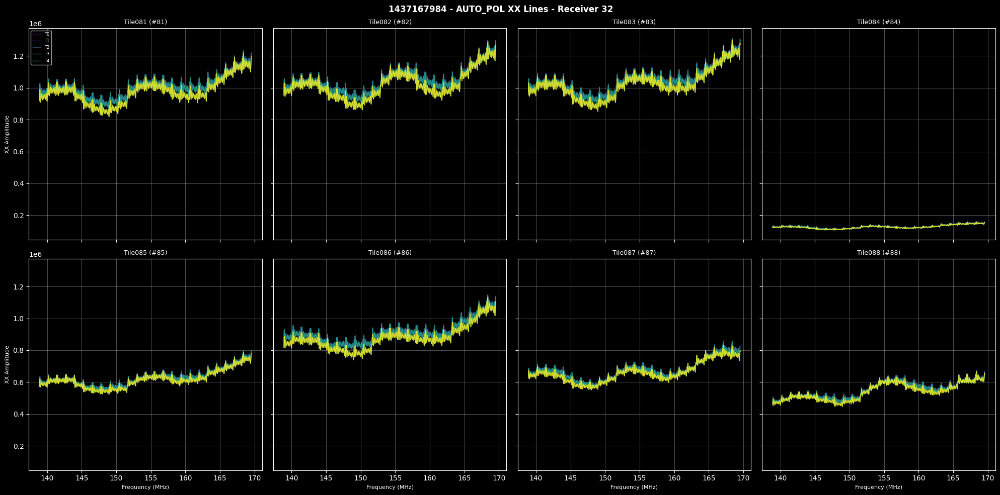

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX32_YY_1437167984.png


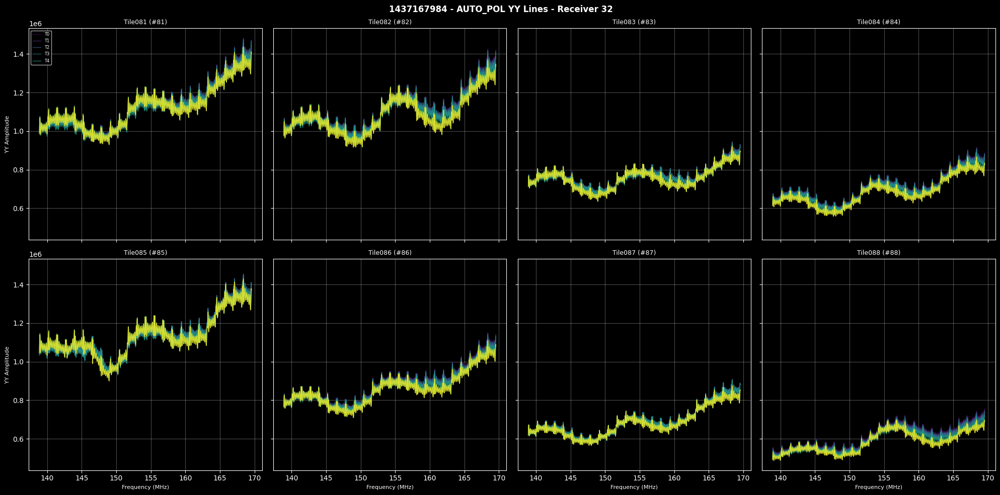

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX32_XY_1437167984.png


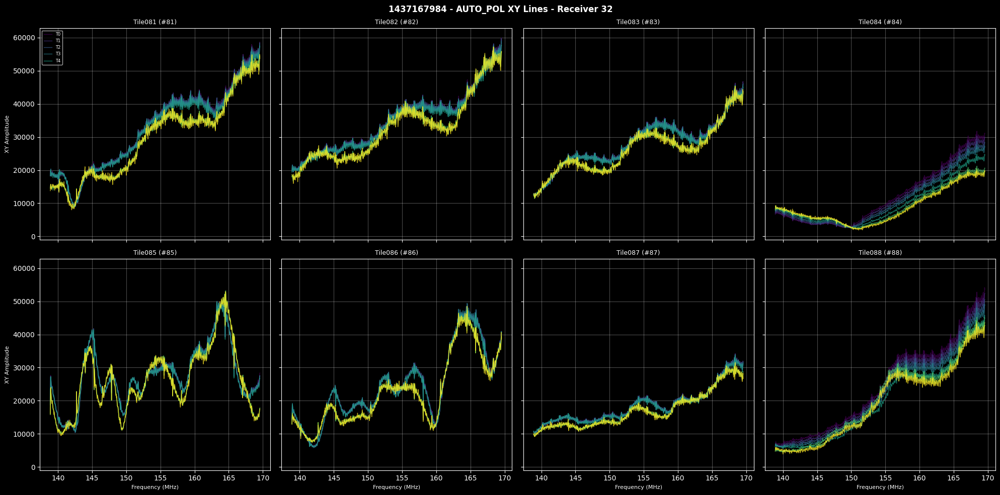

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX33_XX_1437167984.png


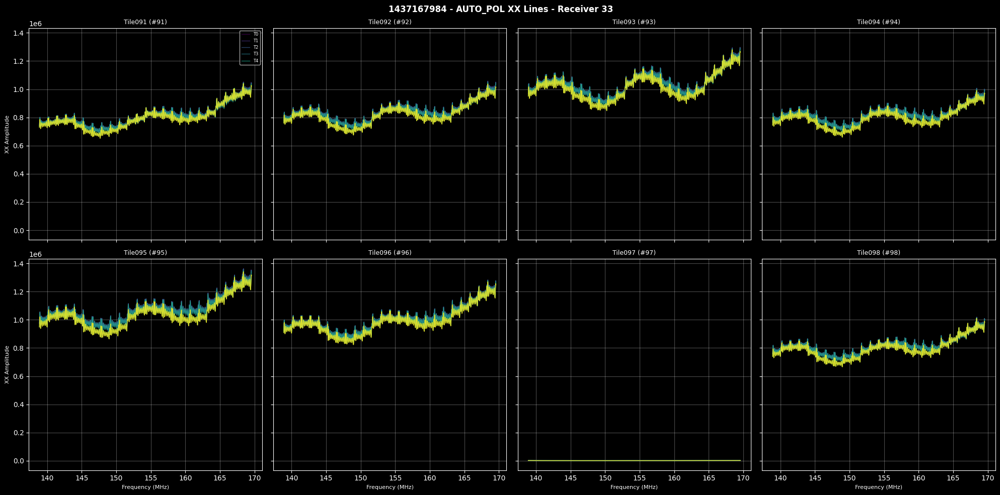

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX33_YY_1437167984.png


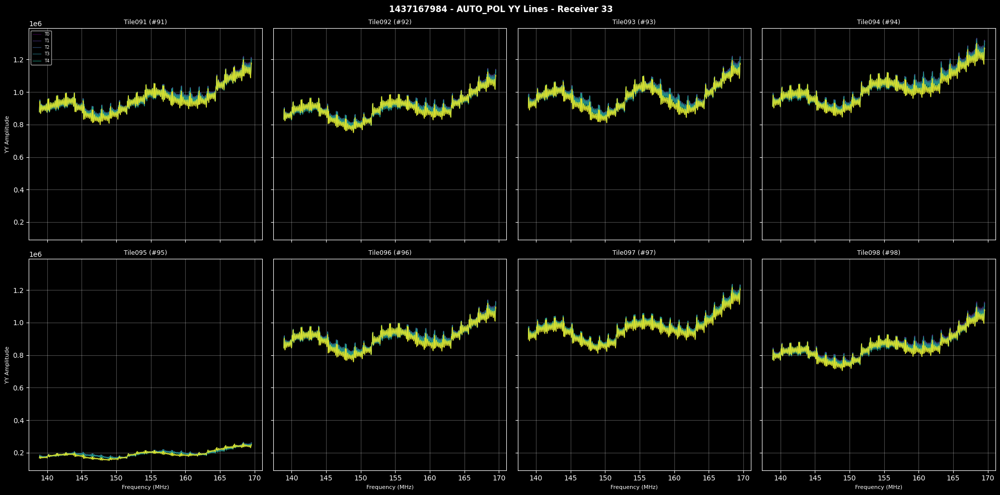

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX33_XY_1437167984.png


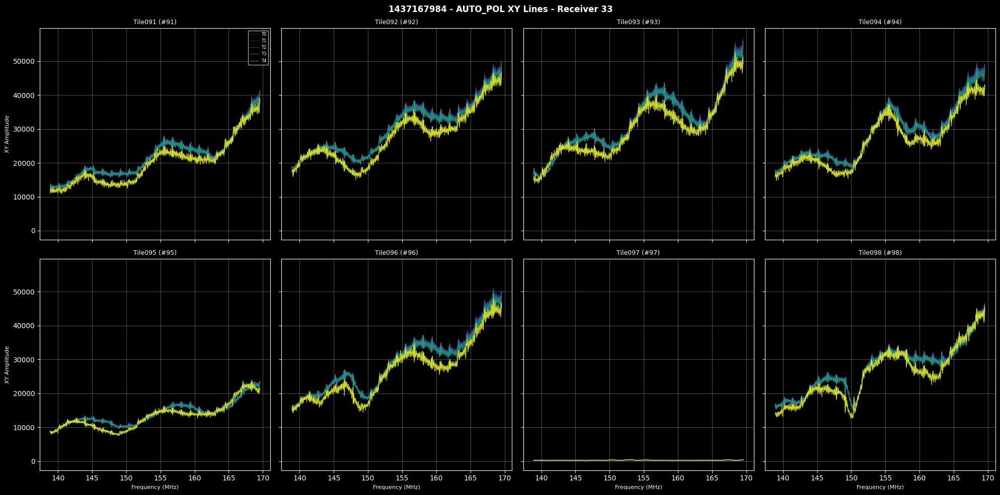

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX34_XX_1437167984.png


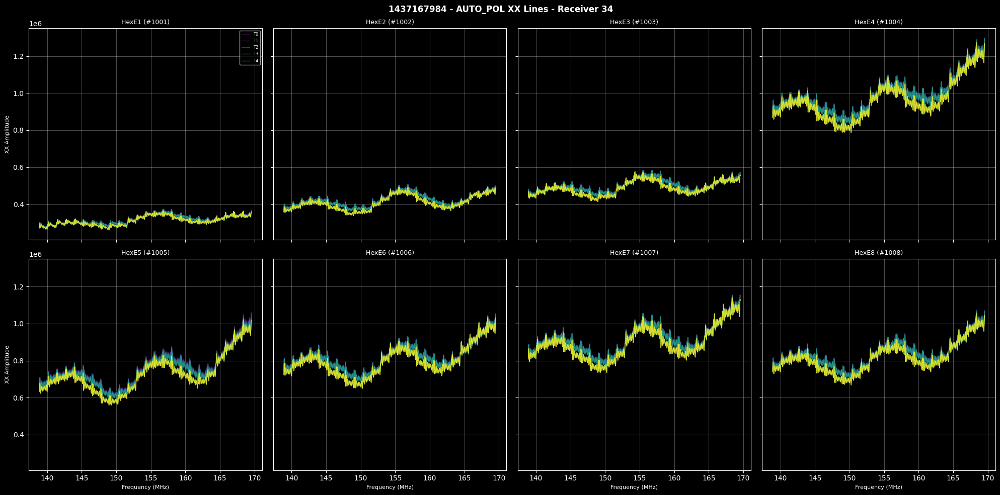

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX34_YY_1437167984.png


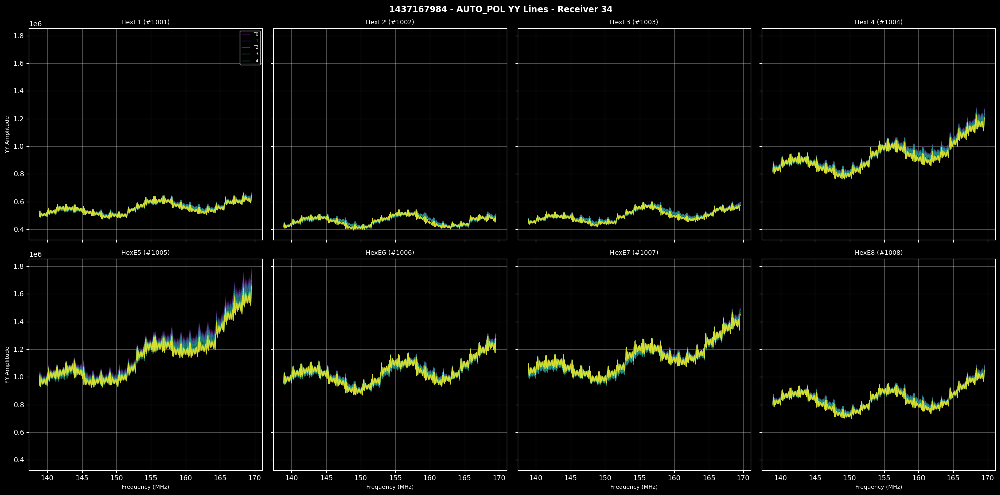

/Users/dev/Code/mwa-demo/demo/auto_pol_lines_RX34_XY_1437167984.png


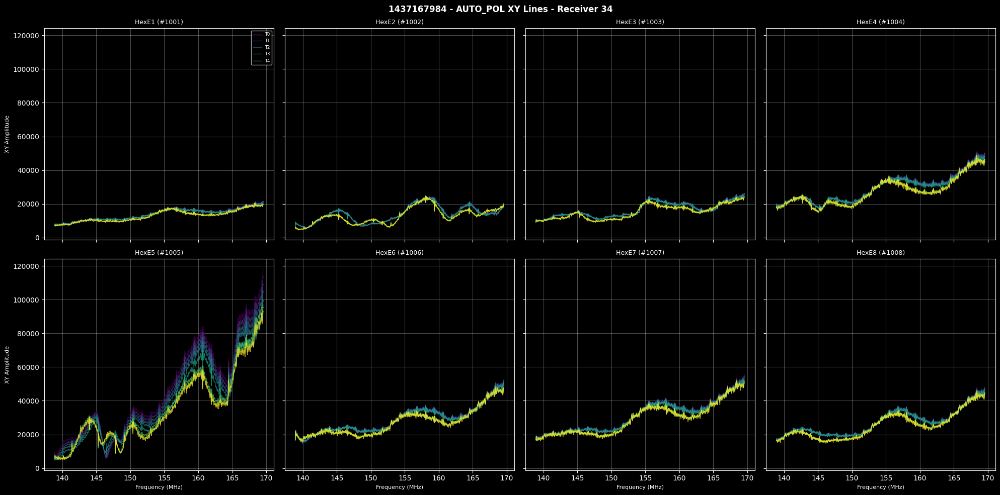

['auto_pol_lines_RX19_XX_1437167984.png',
 'auto_pol_lines_RX19_YY_1437167984.png',
 'auto_pol_lines_RX19_XY_1437167984.png',
 'auto_pol_lines_RX20_XX_1437167984.png',
 'auto_pol_lines_RX20_YY_1437167984.png',
 'auto_pol_lines_RX20_XY_1437167984.png',
 'auto_pol_lines_RX21_XX_1437167984.png',
 'auto_pol_lines_RX21_YY_1437167984.png',
 'auto_pol_lines_RX21_XY_1437167984.png',
 'auto_pol_lines_RX22_XX_1437167984.png',
 'auto_pol_lines_RX22_YY_1437167984.png',
 'auto_pol_lines_RX22_XY_1437167984.png',
 'auto_pol_lines_RX23_XX_1437167984.png',
 'auto_pol_lines_RX23_YY_1437167984.png',
 'auto_pol_lines_RX23_XY_1437167984.png',
 'auto_pol_lines_RX24_XX_1437167984.png',
 'auto_pol_lines_RX24_YY_1437167984.png',
 'auto_pol_lines_RX24_XY_1437167984.png',
 'auto_pol_lines_RX25_XX_1437167984.png',
 'auto_pol_lines_RX25_YY_1437167984.png',
 'auto_pol_lines_RX25_XY_1437167984.png',
 'auto_pol_lines_RX26_XX_1437167984.png',
 'auto_pol_lines_RX26_YY_1437167984.png',
 'auto_pol_lines_RX26_XY_143716798

In [23]:
metrics.plot_auto_pol_lines(data, observation_name, show=True, save=True)

In [ ]:
# Generate 1D timeseries plot
timeseries_file = metrics.plot_timeseries(data, observation_name, show=True, save=True)
print(f"Saved timeseries plot: {timeseries_file}")


In [ ]:
# Generate waterfall plot
waterfall_file = metrics.plot_waterfall(data, observation_name, show=True, save=True)
print(f"Saved waterfall plot: {waterfall_file}")

In [ ]:
# plot_amp_fp_grid
amp_fp_grid_file = metrics.plot_amp_fp_grid(data, observation_name, show=True, save=True)
print(f"Saved amp_fp_grid plot: {amp_fp_grid_file}")

In [ ]:
# auto_pol
metrics.plot_auto_pol(data, observation_name, show=True, save=True)

In [ ]:
# auto_delay_pol
auto_delay_pol_file = metrics.plot_auto_delay_pol(data, observation_name, show=True, save=True)

In [29]:
print("\nAvailable individual plotting functions:")
print("- metrics.plot_timeseries(data, name, show, save)")
print("- metrics.plot_waterfall(data, name, show, save)")
print("- metrics.plot_auto_pol(data, name, show, save)")
print("- metrics.plot_amp_fp_grid(data, name, show, save)")
print("- metrics.plot_auto_power_ant(data, name, show, save)")
print("- metrics.plot_auto_sub_ant(data, name, show, save)")
print("- metrics.plot_auto_delay_pol(data, name, show, save)")


Available individual plotting functions:
- metrics.plot_timeseries(data, name, show, save)
- metrics.plot_waterfall(data, name, show, save)
- metrics.plot_auto_pol(data, name, show, save)
- metrics.plot_amp_fp_grid(data, name, show, save)
- metrics.plot_auto_power_ant(data, name, show, save)
- metrics.plot_auto_sub_ant(data, name, show, save)
- metrics.plot_auto_delay_pol(data, name, show, save)
